# Derivation of Double Pendulum Equations of Motion
<img src="double_pendulum.png" align="left" width="400">

In [1]:
#pip install numpy scipy matplotlib sympy
#may need to install ffmpeg if you do not have it already

In [2]:
# import necessary packages
%matplotlib notebook
%matplotlib inline
import numpy as np 
from scipy.integrate import odeint
from matplotlib import animation
from IPython.display import HTML
import matplotlib.pyplot as plt
from sympy import *
init_printing(use_unicode=True)

In [3]:
# Generalized coordinates 
q1, q2, dq1, dq2, ddq1, ddq2 = symbols('q1 q2 dq1 dq2 ddq1 ddq2')
t = symbols('t')
q1=Function(q1)(t)
q2=Function(q2)(t)
dq1=Function(dq1)(t)
dq2=Function(dq2)(t)
ddq1=Function(ddq1)(t)
ddq2=Function(ddq2)(t)


# System parameters
l1, l2, m1, m2, g = symbols('l1 l2 m1 m2 g')

## Kinematics

In [4]:
print('Position and velocity of m1:')
x1 = l1*sin(q1)
y1 = -l1*cos(q1)
dx1 = l1*cos(q1)*dq1
dy1 = l1*sin(q1)*dq1

print('x1:  ', x1)
print('y1:  ', y1)
print('dx1: ', dx1)
print('dy1: ', dy1)

Position and velocity of m1:
x1:   l1*sin(q1(t))
y1:   -l1*cos(q1(t))
dx1:  l1*dq1(t)*cos(q1(t))
dy1:  l1*dq1(t)*sin(q1(t))


In [5]:
print('Position and velocity of m2:')
x2 = l1*sin(q1)+l2*sin(q2)
y2 = -l1*cos(q1)-l2*cos(q2)
dx2 = l1*cos(q1)*dq1+l2*cos(q2)*dq2
dy2 = l1*sin(q1)*dq1+l2*sin(q2)*dq2

print('x2:  ', x2)
print('y2:  ', y2)
print('dx2: ', dx2)
print('dy2: ', dy2)

Position and velocity of m2:
x2:   l1*sin(q1(t)) + l2*sin(q2(t))
y2:   -l1*cos(q1(t)) - l2*cos(q2(t))
dx2:  l1*dq1(t)*cos(q1(t)) + l2*dq2(t)*cos(q2(t))
dy2:  l1*dq1(t)*sin(q1(t)) + l2*dq2(t)*sin(q2(t))


## Dynamics 

In [6]:
print('Kinetic and potential energies of m1:')
#T1 = 0.5*m1*(dx1**2+dy1**2)
T1 = 0.5*m1*l1**2*dq1**2
V1=m1*g*y1
T1 = simplify(T1)
V1 = simplify(V1)

print('T1: ', T1)
print('V1: ', V1)

Kinetic and potential energies of m1:
T1:  0.5*l1**2*m1*dq1(t)**2
V1:  -g*l1*m1*cos(q1(t))


In [7]:
print('Kinetic and potential energies of m2:')
T2 = 0.5*m2*(dx2**2+dy2**2)
V2 = m2*g*y2
T2 = simplify(T2) 
V2 = simplify(V2)

print('T2: ', T2)
print('V2: ', V2)

Kinetic and potential energies of m2:
T2:  0.5*m2*(l1**2*dq1(t)**2 + 2*l1*l2*dq1(t)*dq2(t)*cos(q1(t) - q2(t)) + l2**2*dq2(t)**2)
V2:  -g*m2*(l1*cos(q1(t)) + l2*cos(q2(t)))


## Compute Lagrangian 
Recall Lagrangian:
 $L(q, \dot q) = T(q, \dot q) - V(q)$
 
 Lagrange equations of motion:
 $\frac{d}{dt}\big(\frac{\partial L}{\partial \dot q_i }\big) - \frac{\partial L}{\partial q_i} = 0$ 
         for i = 1, 2


In [8]:
print('Calculate the Lagrangian of the system: ')
T = T1+T2
T = simplify(T)
V = V1+V2
V = simplify(V)
L = T-V

print('L: ', L)

Calculate the Lagrangian of the system: 
L:  g*(l1*m1*cos(q1(t)) + l1*m2*cos(q1(t)) + l2*m2*cos(q2(t))) + 0.5*l1**2*m1*dq1(t)**2 + 0.5*m2*(l1**2*dq1(t)**2 + 2*l1*l2*dq1(t)*dq2(t)*cos(q1(t) - q2(t)) + l2**2*dq2(t)**2)


We use $dLddq$ as short for $\frac{\partial L}{\partial \dot q}$ and $dLdq$ 
for $\frac{\partial L}{\partial q}$. 

In [ ]:
# Calculate the partial derivatives of Lagrangian:
# dLddq1 = m2*l1**2*dq1
# dLddq2 = m2*l1**2*dq1+m2*l1*l2*dq2*cos(q1-q2)
# dLdq1  = 0 - m1*g*l1*sin(q1)
# dLdq2  = m2*l1*l2*dq1*dq2*sin(q1-q2)-m2*g*l2*sin(q1)
# Calculate the partial derivatives of Lagrangian:




# dLddq1 = m1*l1**2*dq1 + m2*l1**2*dq1+m2*l1*l2*dq2*cos(q1-q2)
# dLddq2 = 0 + m2*l2**2*dq2+m2*l1*l2*dq1*cos(q1-q2)

# #dLdq1  = (0 - m2*l1*l2*dq1*dq2*sin(q1-q2)) - (m1*g*l1*sin(q1)+m2*g*l1*sin(q1))
# dLdq1  = (0 - m2*l1*l2*dq1*dq2*sin(q1-q2)) - (m1*g*l1*sin(q1)+m2*g*l1*sin(q1))
# dLdq2  = (0+m2*l1*l2*dq1*dq2*sin(q1-q2)) - (0 + m2*g*l2*sin(q1))

dLddq1 = diff(L,dq1)
dLddq2 = diff(L,dq2)

dLdq1  = diff(L,q1)
dLdq2  = diff(L,q2)


dLddq1 = simplify(dLddq1)
dLddq2 = simplify(dLddq2)
dLdq1  = simplify(dLdq1)
dLdq2  = simplify(dLdq2)

We use dLddq_dt for $\frac{d}{dt}\big(\frac{\partial L}{\partial \dot q}\big)$

In [10]:
#dLddq1_dt = diff(dLddq1,t)  
dLddq1_dt = dLddq1.diff(q1)*dq1 + dLddq1.diff(q2)*dq2 + dLddq1.diff(dq1)*ddq1 + dLddq1.diff(dq2)*ddq2
display(dLddq1_dt)

dLddq2_dt = dLddq2.diff(q1)*dq1 + dLddq2.diff(q2)*dq2 + dLddq2.diff(dq1)*ddq1 + dLddq2.diff(dq2)*ddq2
display(dLddq2_dt)

In [12]:
print('Calculate equations of motion: ')
#Eq1 = dLddq1_dt - dLddq1 
Eq1 = dLddq1_dt - dLdq1 
Eq2 = dLddq2_dt - dLdq2

# Substitute time derivatives with ddq1, ddq2, and dq1, dq2 symbols
Eq1 = Eq1.subs({Derivative(dq1,t): ddq1, Derivative(dq2,t): ddq2, Derivative(q1,t): dq1, Derivative(q2,t): dq2})
Eq2 = Eq2.subs({Derivative(dq1,t): ddq1, Derivative(dq2,t): ddq2, Derivative(q1,t): dq1, Derivative(q2,t): dq2})

Eq1 = simplify(Eq1)
Eq2 = simplify(Eq2)

print('Eq1: ', Eq1)
print('Eq2: ', Eq2)

Calculate equations of motion: 
Eq1:  l1*(g*(m1 + m2)*sin(q1(t)) + 1.0*l1*(m1 + m2)*ddq1(t) + 1.0*l2*m2*ddq2(t)*cos(q1(t) - q2(t)) + 1.0*l2*m2*dq2(t)**2*sin(q1(t) - q2(t)))
Eq2:  1.0*l2*m2*(g*sin(q2(t)) + l1*ddq1(t)*cos(q1(t) - q2(t)) - l1*dq1(t)**2*sin(q1(t) - q2(t)) + l2*ddq2(t))


In [14]:
# Use the "subs" function 
print('Calculate Mass matrix (M), Coriolis and gravity terms (C and  G):')
#G = Gravity
G = zeros(2,1) 
G[0,0] = Eq1.subs({ddq1:0,ddq2:0,dq1:0,dq2:0}).simplify()
G[1,0] = Eq2.subs({ddq1:0,ddq2:0,dq1:0,dq2:0}).simplify()
G = simplify(G)
#print('-------------------------\nG:\n',G)
display(G)

# #M = Mass matrix
M = zeros(2,2)
M[0,0] = Eq1.subs({ddq1:1,ddq2:0,dq1:0,dq2:0,g:0}).simplify()
M[0,1] = Eq1.subs({ddq1:0,ddq2:1,dq1:0,dq2:0,g:0}).simplify()
M[1,0] = Eq2.subs({ddq1:1,ddq2:0,dq1:0,dq2:0,g:0}).simplify()
M[1,1] = Eq2.subs({ddq1:0,ddq2:1,dq1:0,dq2:0,g:0}).simplify()
# M[0,0] = m1*l1**2*ddq1+ m2*l1**2*ddq1
# M[0,1] = m2*l1*l2*cos(q1-q2)*ddq2
# M[1,0] = m2*l1*l2*cos(q1-q2)*ddq1
# M[1,1] = m2*l2**2*ddq2
# M[0,0]=(m1 + m2)*l1**2 + m2*l2**2 + 2*m2*l1*l2*cos(q1 - q2)
# M[0,1]=m2*l2**2 + m2*l1*l2*cos(q1 - q2)
# M[1,0]=m2*l2**2 + m2*l1*l2*cos(q1 - q2)
# M[1,1]=m2*l2**2

M = simplify(M)
#print('-------------------------\nM:\n', M)
display(M)
# # # #C = Coriolis
C = zeros(2,2) 
# C[0,0] = Eq1.subs({ddq1:0,ddq2:0,dq1:1,dq2:0,g:0}).simplify()
# C[0,1] = Eq1.subs({ddq1:0,ddq2:0,dq1:0,dq2:1,g:0}).simplify()
# C[1,0] = Eq2.subs({ddq1:0,ddq2:0,dq1:1,dq2:0,g:0}).simplify()
# C[1,1] = Eq2.subs({ddq1:0,ddq2:0,dq1:0,dq2:1,g:0}).simplify()
C[0,0] = dLddq1_dt.coeff(dq1)
C[0,1] = dLddq1_dt.coeff(dq2)
C[1,0] = dLddq2_dt.coeff(dq1)
C[1,1] = dLddq2_dt.coeff(dq2)


# C[0,0] = 0
# C[0,1] = -m2*l1*l2*sin(q1 - q2)*dq2
# C[1,0] =  m2*l1*l2*sin(q1 - q2)*dq1
# C[1,1] = 0

C = simplify(C)
#print('-------------------------\nC:\n', C)

display(C)

Calculate Mass matrix (M), Coriolis and gravity terms (C and  G):


⎡g⋅l₁⋅(m₁ + m₂)⋅sin(q₁(t))⎤
⎢                         ⎥
⎣ 1.0⋅g⋅l₂⋅m₂⋅sin(q₂(t))  ⎦

⎡             2                                                  ⎤
⎢       1.0⋅l₁ ⋅(m₁ + m₂)         1.0⋅l₁⋅l₂⋅m₂⋅cos(q₁(t) - q₂(t))⎥
⎢                                                                ⎥
⎢                                                 2              ⎥
⎣1.0⋅l₁⋅l₂⋅m₂⋅cos(q₁(t) - q₂(t))            1.0⋅l₂ ⋅m₂           ⎦

⎡-1.0⋅l₁⋅l₂⋅m₂⋅dq₂(t)⋅sin(q₁(t) - q₂(t))  -1.0⋅l₁⋅l₂⋅m₂⋅dq₁(t)⋅sin(q₁(t) - q₂( ↪
⎢                                                                              ↪
⎣1.0⋅l₁⋅l₂⋅m₂⋅dq₂(t)⋅sin(q₁(t) - q₂(t))   1.0⋅l₁⋅l₂⋅m₂⋅dq₁(t)⋅sin(q₁(t) - q₂(t ↪

↪ t))⎤
↪    ⎥
↪ )) ⎦

In [15]:
# create M, C, G functions to evaluate at certain points

eval_M = lambdify((l1,l2,m1,m2,q1,q2),M)
eval_C = lambdify((dq1,dq2,l1,l2,m2,q1,q2), C)
eval_G = lambdify((g,l1,l2,m1,m2,q1,q2), G)

In [16]:
# Define functions to get sample parameters, compute the dynamics, and get mass locations

# helper functions to return mass locations (x1,y1) (x2,y2)
eval_x1 = lambdify((q1,l1),x1)
eval_y1 = lambdify((q1,l1),y1)
eval_x2 = lambdify((q1,q2,l1,l2),x2) 
eval_y2 = lambdify((q1,q2,l1,l2),y2) 


def set_parameters():
    # sample parameters
    m1 = 1
    m2 = 1
    l1 = 0.5
    l2 = 0.5
    g = 9.81
    return m1, m2, l1, l2, g


def dynamics(y,t):
    # create dynamics
    m1, m2, l1, l2, g = set_parameters()

    q  = np.array([y[0],y[1]])
    dq = np.array([y[2],y[3]])

    M = eval_M(l1,l2,m1,m2,q[0],q[1])
    C = eval_C(dq[0],dq[1],l1,l2,m2,q[0],q[1])
    G = eval_G(g,l1,l2,m1,m2,q[0],q[1])

    dy = np.zeros(4)
    dy[0] = y[2]
    dy[1] = y[3]
    dy[2:] = np.linalg.solve(M, (-C @ dq ).reshape(2,1) - G)[:,0]
    return dy

def get_x1y1_x2y2(th1,th2):
    # get mass locations
    _, _, l1, l2, _ = set_parameters()
    return (eval_x1(th1,l1), 
            eval_y1(th1,l1),
            eval_x2(th1,th2,l1,l2),
            eval_y2(th1,th2,l1,l2))

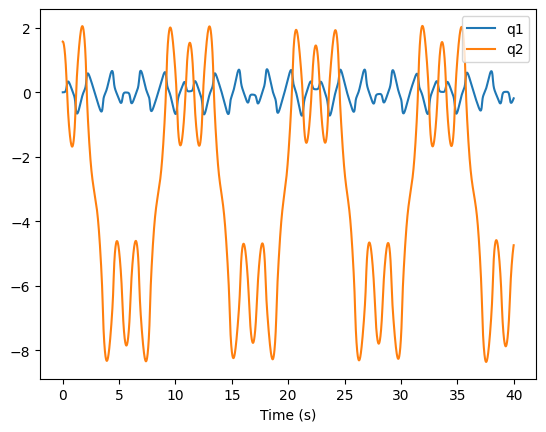

In [17]:
# create time array to evaluate dynamics
t = np.linspace(0,40,20001)
global dt 
dt = t[1] - t[0]

# simulate from starting position
states = odeint(dynamics, y0=[0,np.pi/2,0,0], t=t)

# plot q1 and q2
plt.plot(t, states[:,0], label="q1")
plt.plot(t, states[:,1], label="q2")
plt.xlabel('Time (s)')
plt.legend()
plt.show()

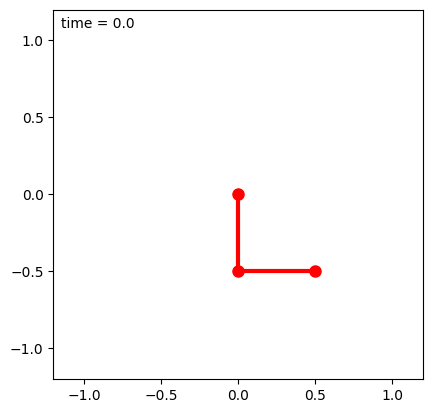

In [18]:
# animate pendulum (may take some time)
plt.rc('animation', html='html5')

fig = plt.figure()
ax = plt.gca()
ln1, = plt.plot([], [], 'ro-', lw=3, markersize=8)
ax.set_xlim(-1.2,1.2)
ax.set_ylim(-1.2,1.2)
plt.gca().set_aspect('equal', adjustable='box')
time_text = ax.text(0.02, 0.95, '', transform=ax.transAxes)

# extract mass positions
x1, y1, x2, y2 = get_x1y1_x2y2(states[:,0], states[:,1])

def animate(i):
    global dt
    ln1.set_data([0,x1[i],x2[i]], [0, y1[i], y2[i]])
    time_text.set_text('time = %.1f' % (float(i)*dt))
    return ln1

ani = animation.FuncAnimation(fig, animate, frames=len(t), interval=int(dt*1000))
ani